# Bibliotecas

In [2]:
from q1 import filtroGaussiano, filtroMedia, filtroLaplaciano, filtroSobel, filtroPrewitt, convolucao
from imagem import Imagem
from nao_lineares import applyFilter
from skimage.util import random_noise
from skimage.io import imread,imsave,imshow

# Leitura Imagem

In [3]:
img = Imagem('sunflower.jpg')
img.ler()

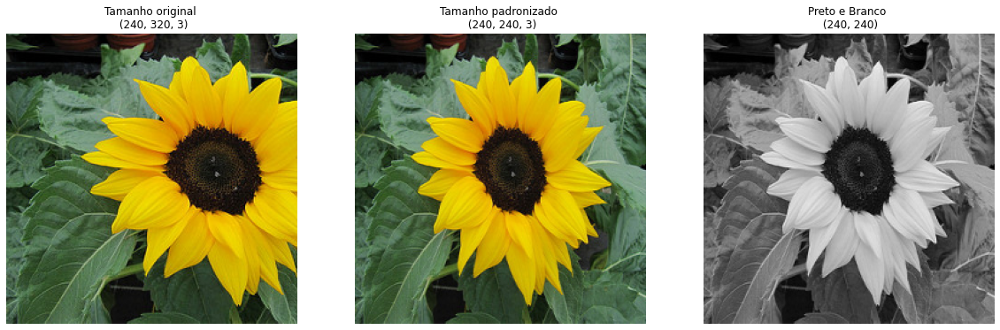

In [3]:
img.shows()

# Questão 1

Nessa função apresentamos diferentes filtros (Média, Prewitt, Gaussiano, Sobel e o Laplaciano) aplicados em diferentes tratamentos de borna na imagem (ignorar, zero, espelhar e replicar) com diferentes tipos de imagem (colorida e em níveis de cinza).

In [4]:
def montaApresentacao(imagem, filtro):
    imgs = {
        'ignore': convolucao(imagem, filtro, 'ignore'),
        'padding': convolucao(imagem, filtro, 'padding'),
        'espelho': convolucao(imagem, filtro, 'espelho'),
        'replicar': convolucao(imagem, filtro, 'replicar')
    }
    img.manyShowWithTitle(
        {'img': imgs['ignore'], 'title': 'Média - ignore'}, 
        {'img': imgs['padding'], 'title': 'Média - padding'}, 
        {'img': imgs['espelho'], 'title': 'Média - espelho'}, 
        {'img': imgs['replicar'], 'title': 'Média - replicar'}, 
        color='gray'
    )

## Média
O filtro da média é uma técnica que permite a redução de ruído em uma imagem. Considerando uma dada vizinhança MxN, o método consiste em calcular a média de todos os pontos dentro desta vizinhança para cada pixel da imagem original.
Nesses exemplos abaixos, levamos em cosideração quatro estilos de bordas, que foram:
* Ignorar: onde a borda não será considerada nos cálculos.
* Espelhar: onde os pixels são espelhados da imagem.
* Replicar: onde o último pixel da imagem é replicado.
* Padding ou Zero: onde os pixels fora da imagem são de valor zero.

Nos exemplos abaixo utilizamos uma imagem colorida e uma em escala cinza, variando entre os tipos de bordas implementados. O tamanho da janela foi definido como 3x3.

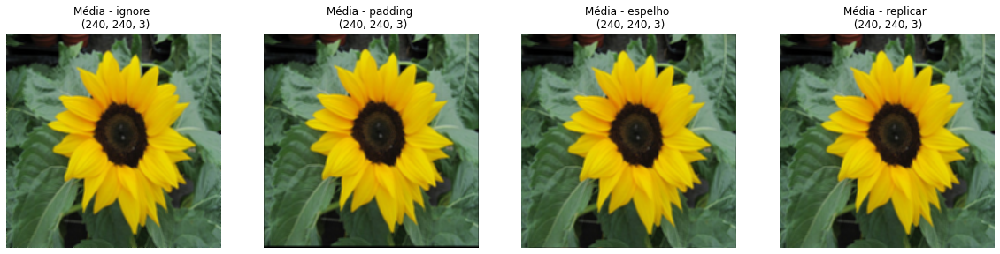

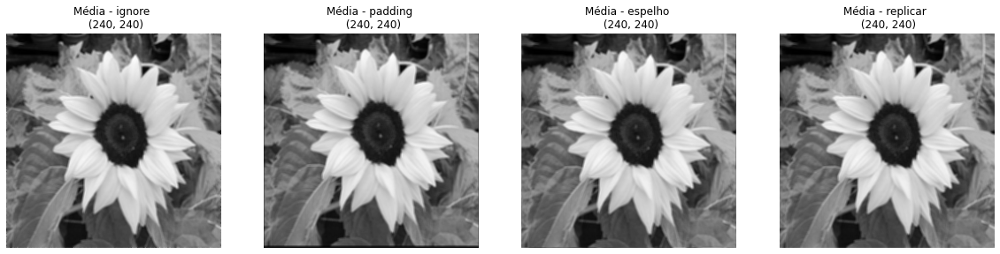

In [7]:
montaApresentacao(img.imgRed, filtroMedia)
montaApresentacao(img.imgGray, filtroMedia)

## Prewitt
O função de Prewitt é usado no processamento de imagem, particularmente na detecção de borda algoritmos. Tecnicamente, é uma operador de diferença, calcular uma aproximação do gradiente da imagem de intensidade de função. Nos exemplos abaixo utilizamos uma janela 3x3.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


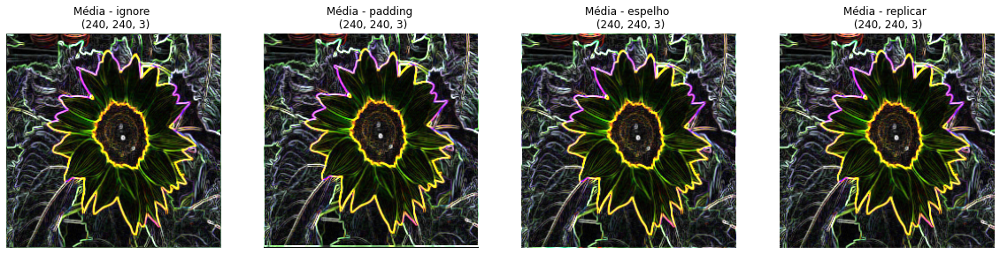

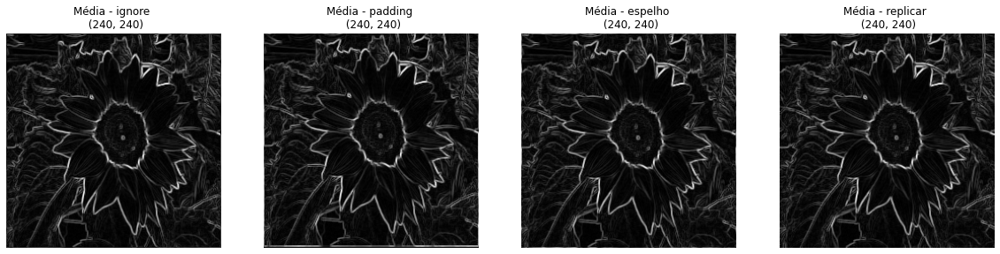

In [8]:
montaApresentacao(img.imgRed, filtroPrewitt)
montaApresentacao(img.imgGray, filtroPrewitt)

## Gaussiano
Um filtro gaussiano é utilizado para borrar ou desfocar a imagem na qual ele é aplicado com o objetivo de reduzir os ruídos presentes na imagem.

Os testes nessas imagens foram feitos com uma janela 5x5, em todos os tipos de bordas e em duas imagens (colorida e em escala cinza).

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


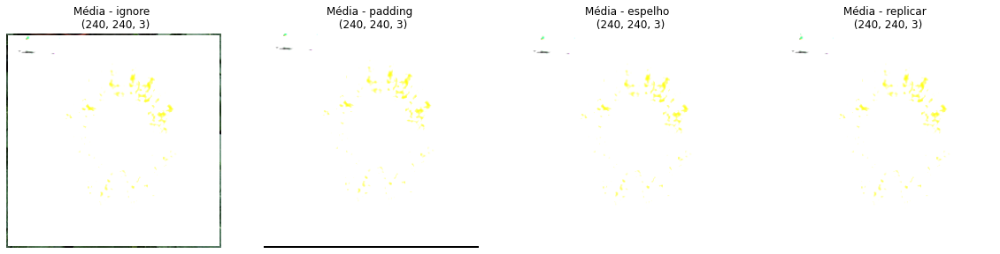

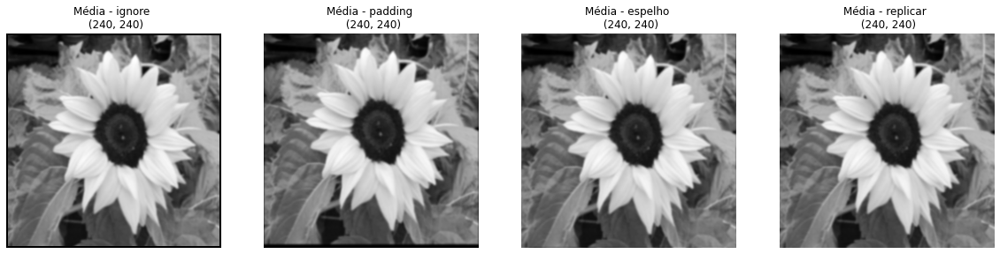

In [9]:
montaApresentacao(img.imgRed, filtroGaussiano)
montaApresentacao(img.imgGray, filtroGaussiano)

## Sobel
O filtro Sobel é uma operação utilizada em processamento de imagem, aplicada sobretudo em algoritmos de detecção de contornos.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


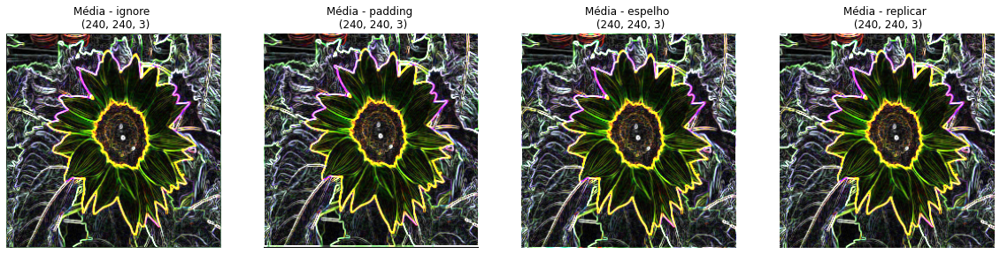

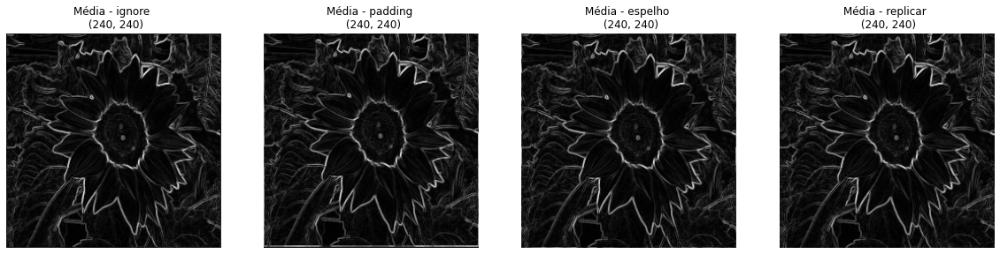

In [10]:
montaApresentacao(img.imgRed, filtroSobel)
montaApresentacao(img.imgGray, filtroSobel)

## Laplaciano
O filtro Laplaciano enfatiza regiões de descontinuidade e ameniza regiões de variação lenta de níveis de intensidade.
Os exemplos abaixo demostram a capacidade do filtro tem em imagens. A mascára utilizada foi a seguinte: [-1,-1,-1]
[-1,8,-1][-1,-1,-1].

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


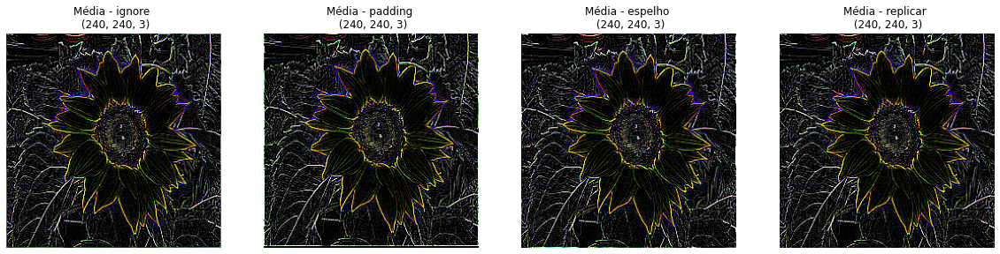

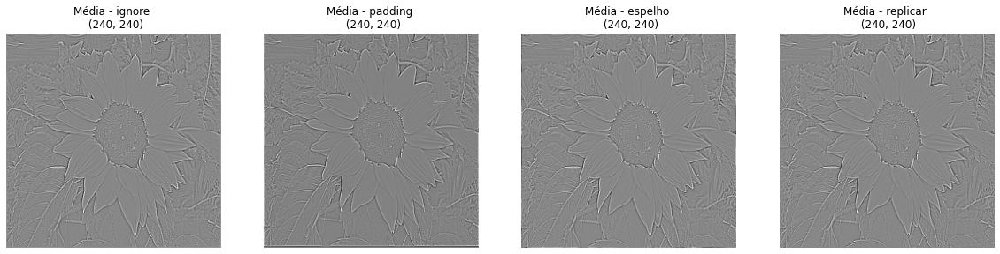

In [11]:
montaApresentacao(img.imgRed, filtroLaplaciano)
montaApresentacao(img.imgGray, filtroLaplaciano)

# Questão 2

In [3]:
def montaTeste(imagem, quadro):
    return { 
        'mediana': {
            'img': applyFilter(imagem, 'mediana', quadro),
            'title': f'Mediana\nQuadro: {quadro}'
        }, 
        'moda': {
            'img': applyFilter(imagem, 'moda', quadro),
            'title': f'Moda\nQuadro: {quadro}'
        },
        'maximo': {
            'img': applyFilter(imagem, 'maximo', quadro),
            'title': f'Máximo\nQuadro: {quadro}'
        },
        'minimo': {
            'img': applyFilter(imagem, 'minimo', quadro),
            'title': f'Minimo\nQuadro: {quadro}'
        }
    }

In [14]:
def variosTestes(imagem, max=9):
    for i in range(3, max+1, 2):
        quadro = [i, i]
        teste = montaTeste(imagem, quadro)
        img.manyShowWithTitle(teste['mediana'], teste['moda'], teste['maximo'], teste['minimo'], color='gray')

minimo - [9, 9]: 100%|██████████| 238/238 [00:03<00:00, 65.00it/s]


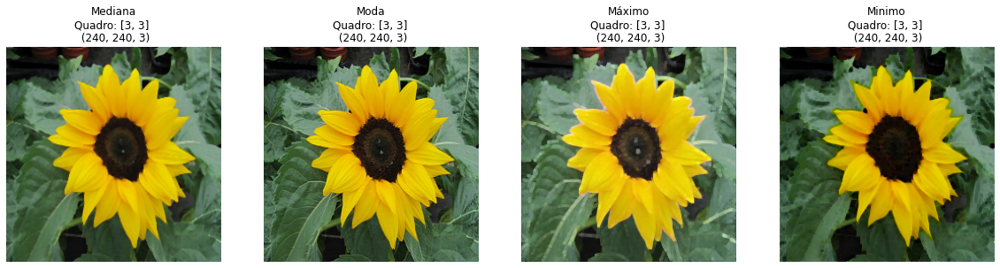

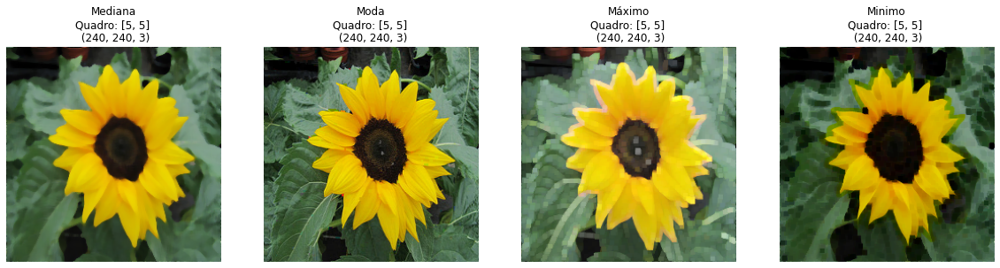

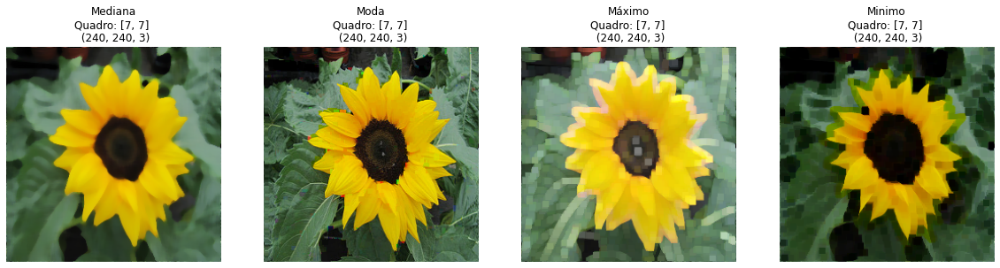

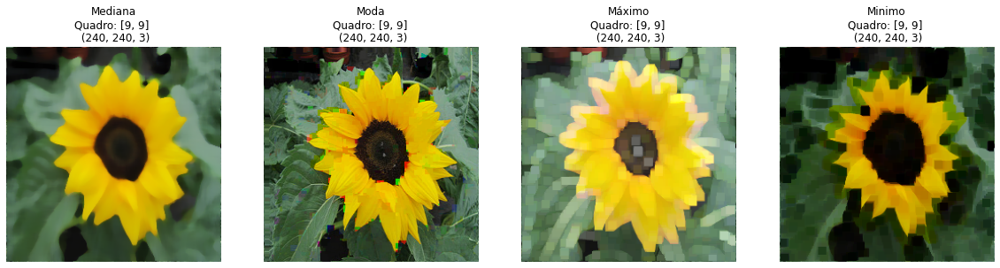

In [16]:
variosTestes(img.imgRed)

minimo - [9, 9]: 100%|██████████| 238/238 [00:01<00:00, 121.64it/s]


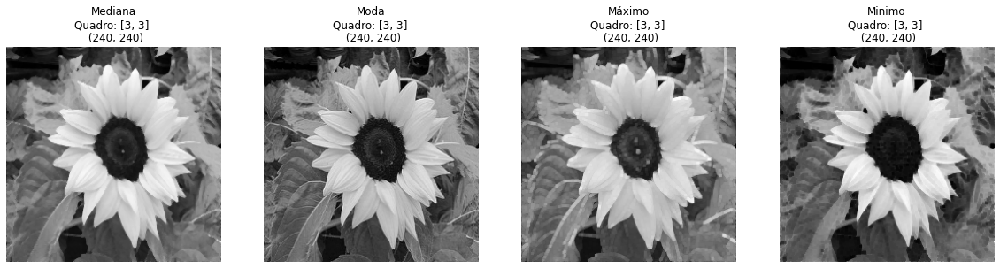

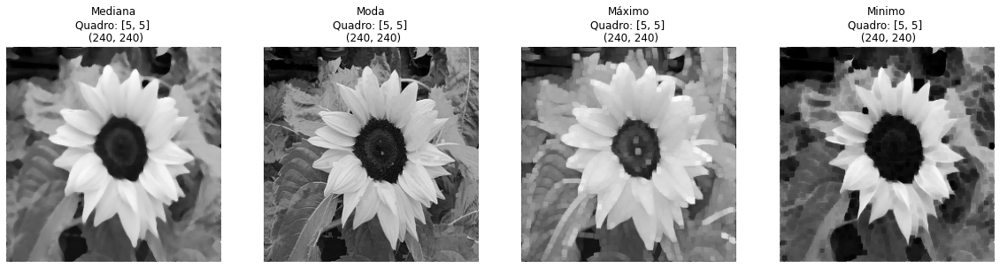

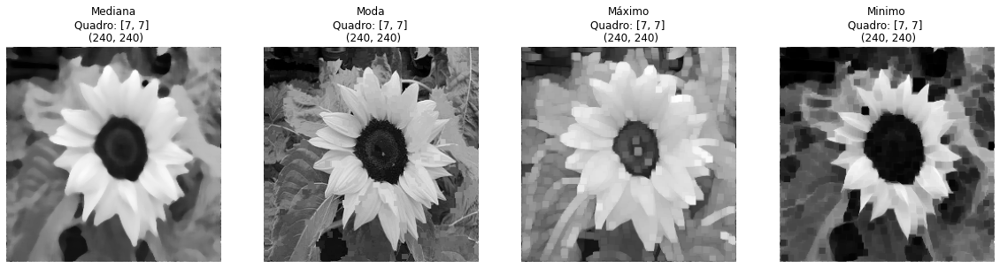

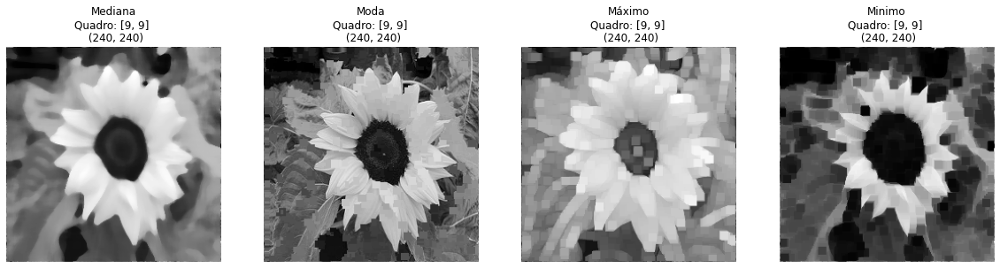

In [17]:
variosTestes(img.imgGray)

# Questão 3

In [15]:
def realcar(imagem):
    lapla = convolucao(imagem, filtroLaplaciano, 'ignore')
    soma = lapla + imagem
    img.manyShowWithTitle(
        {'img': imagem, 'title': 'Original'},
        {'img': lapla, 'title': 'Laplaciano'},
        {'img': soma, 'title': 'Original + Laplaciano'}
    )

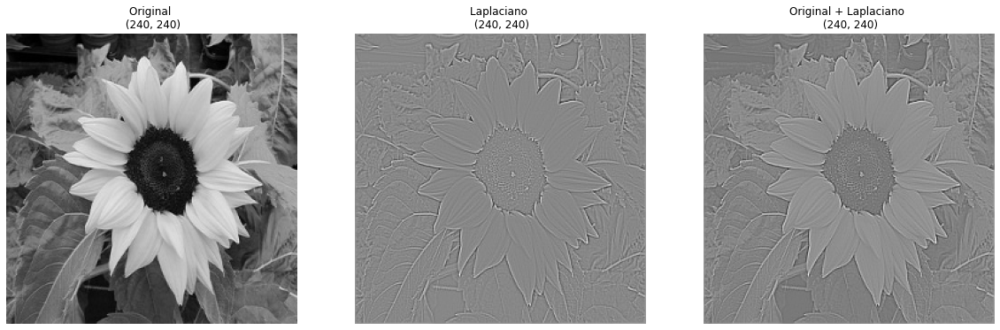

In [17]:
realcar(img.imgGray)

A partir da filtro Laplaciano é possível perceber que as áreas de borda da imagem tiveram mais ênfanse do que áreas que não a borda dos objetos presentes na imagem (folhas e o girassol).

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


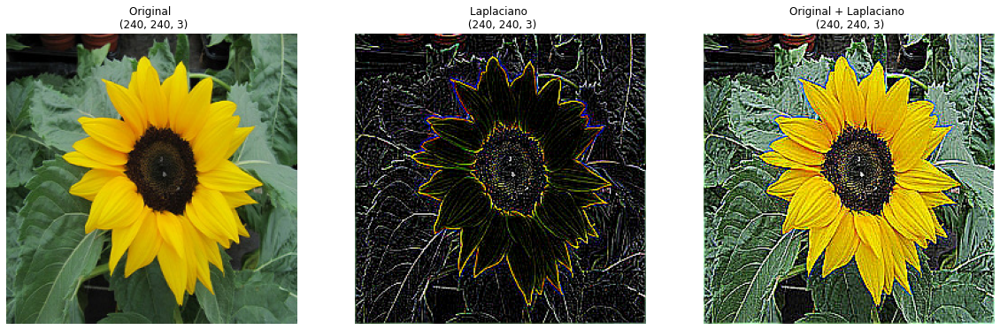

In [16]:
realcar(img.imgRed)

# Questão 4

Nessa função testamos 5 valores para _k_ (0.2, 0.5, 1.0, 1.5, 2.0) em dois tipos de imagem (colorida e em níveis de cinza). Quanto o maior o valor de _k_, maior a ênfase e realce em certos pontos da imagem.

In [19]:
def nitidez(imagem, k):
    media = convolucao(imagem, filtroMedia, 'padding')
    mascara = imagem - media
    resultado = imagem + (k * mascara)

    img.manyShowWithTitle(
        {'img': imagem, 'title': f'Imagem original'},
        {'img': media, 'title': f'Média'},
        {'img': mascara, 'title': f'Máscara'},
        {'img': resultado, 'title': f'Imagem com nitidez\nk = {k}'},
        color='gray'
    )

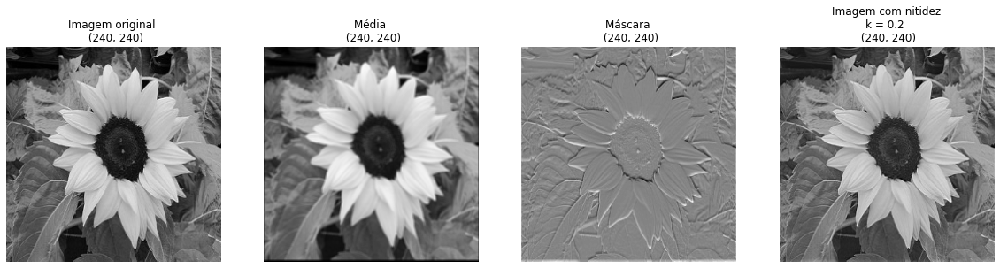

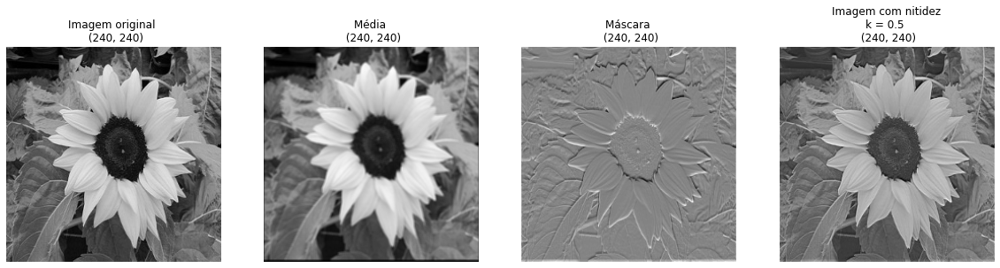

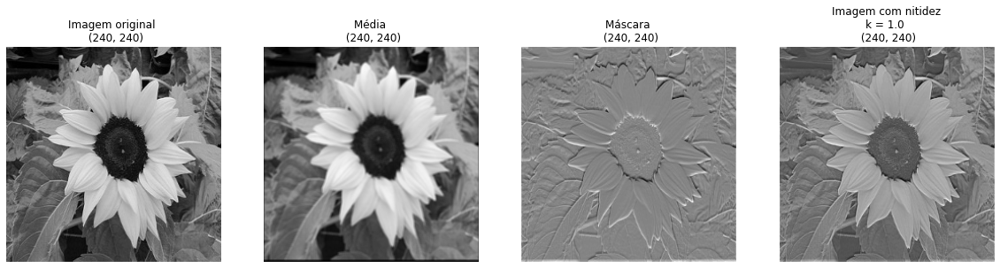

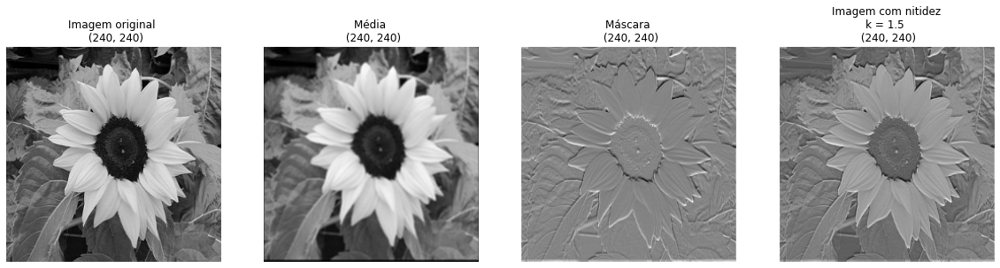

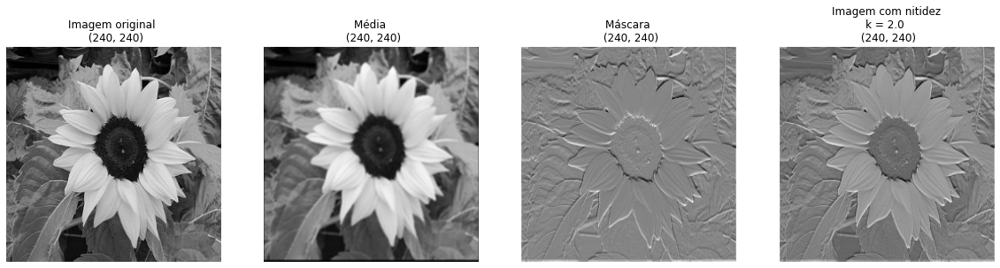

In [22]:
for k in [0.2, 0.5, 1.0, 1.5, 2.0]:
    nitidez(img.imgGray, k)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

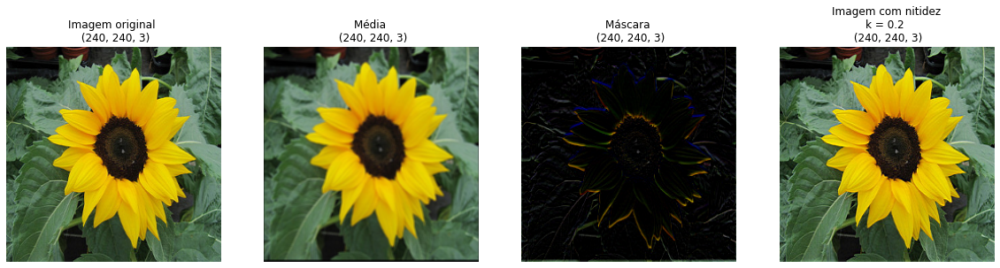

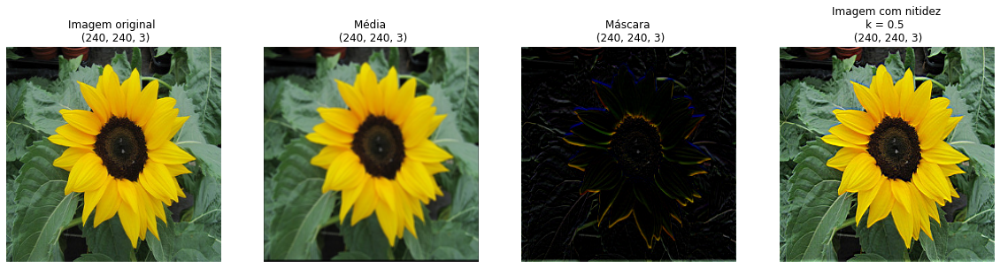

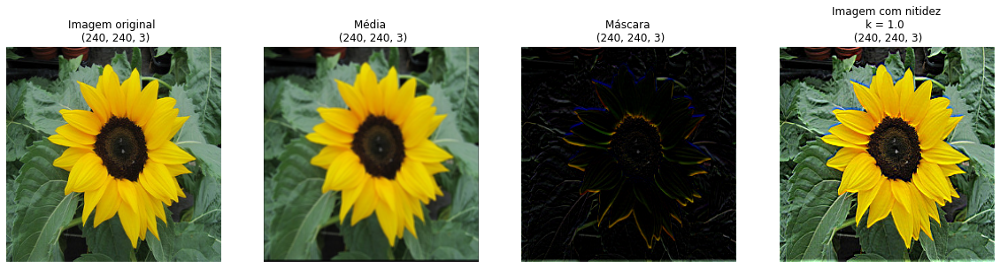

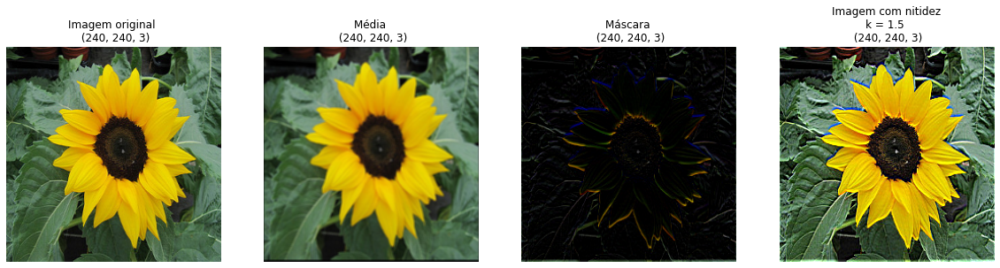

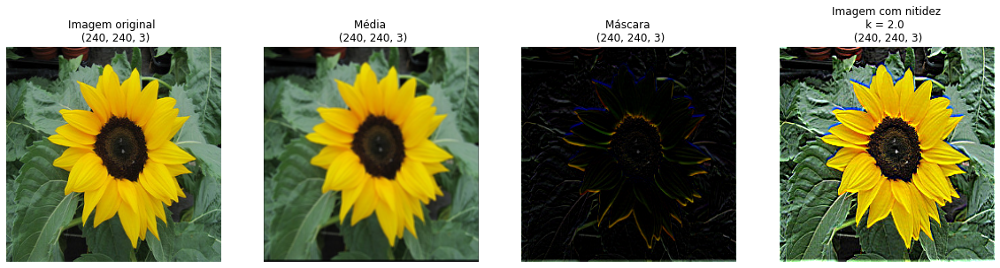

In [23]:
for k in [0.2, 0.5, 1.0, 1.5, 2.0]:
    nitidez(img.imgRed, k)

# Questão 5

O tipo de ruído utilizado foi o Sal e Pimenta. Utilizamos o filtro da média e os filtros não-lineares (média, moda, mediana) e testamos com imagens ruidosas coloridas e em escala cinza. Nos testes, é possível observar que o filtro da mediana foi melhor que o filtro da média.

In [13]:
def ruido(imagem, quadro, a=0.1):
    imgRuido = random_noise(imagem, mode='s&p', amount=a)
    media = convolucao(imgRuido, filtroMedia, 'replicar')
    mediana = applyFilter(imgRuido, 'mediana', quadro)
    moda = applyFilter(imgRuido, 'moda', quadro)
    maximo = applyFilter(imgRuido, 'maximo', quadro)
    minimo = applyFilter(imgRuido, 'minimo', quadro)
    img.manyShowWithTitle(
        {'img': img.imgRed, 'title': 'Original'},
        {'img': imgRuido, 'title': 'Imagem com ruído'}, 
        {'img': mediana, 'title': 'Mediana'},
        {'img': media, 'title': 'Média'},
        {'img': moda, 'title': 'Moda'},
        {'img': maximo, 'title': 'Máximo'},
        {'img': minimo, 'title': 'Mínimo'},
        color='gray'
    )


minimo - [3, 3]: 100%|███████████████████████| 238/238 [00:01<00:00, 230.06it/s]


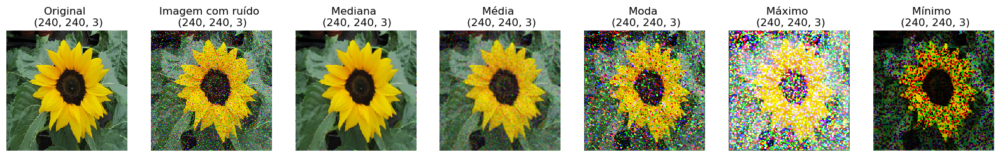

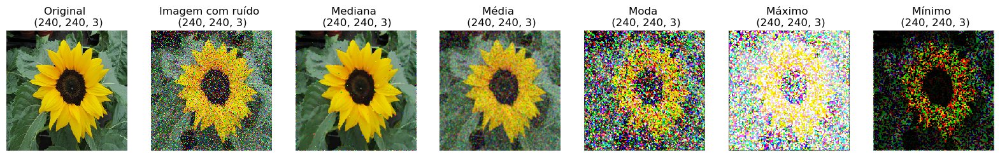

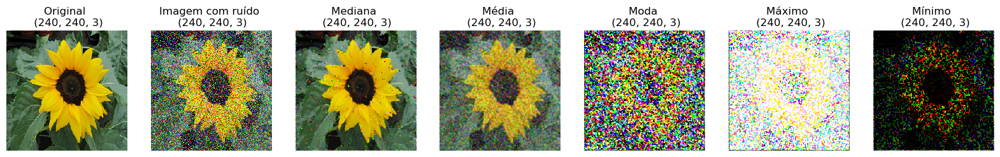

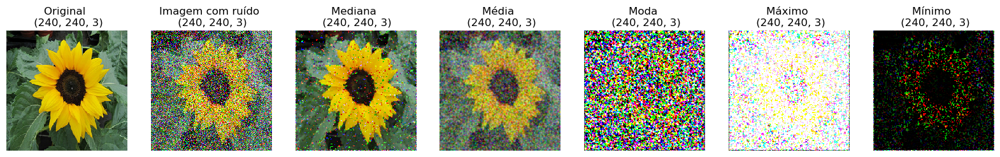

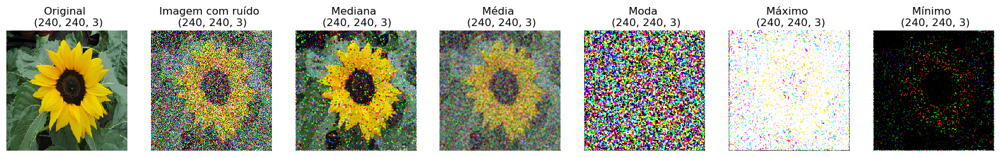

In [14]:
for i in [0.1, 0.2, 0.3, 0.4, 0.5]:
    ruido(img.imgRed, [3, 3], i)

minimo - [3, 3]: 100%|███████████████████████| 238/238 [00:01<00:00, 187.27it/s]


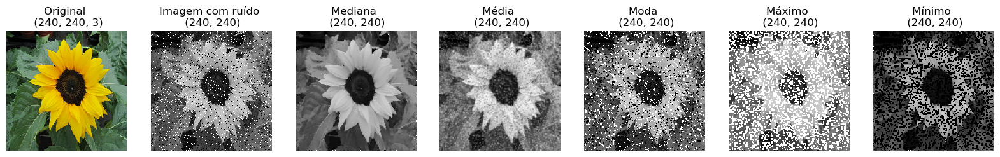

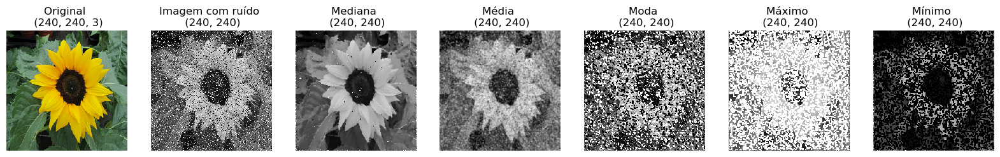

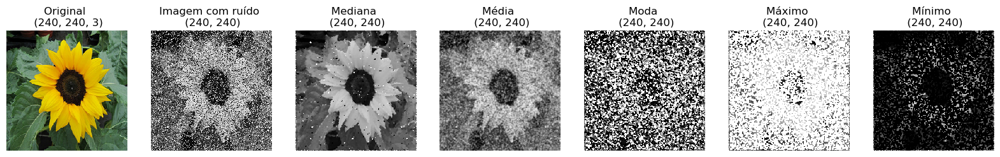

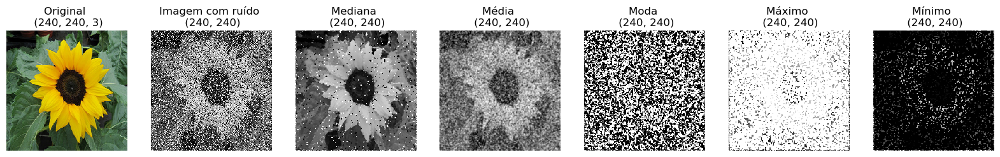

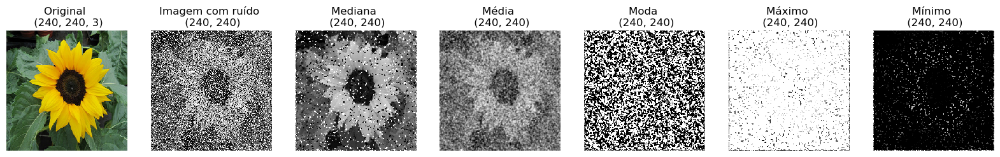

In [15]:
for i in [0.1, 0.2, 0.3, 0.4, 0.5]:
    ruido(img.imgGray, [3, 3], i)